# Imports

In [5]:
# Import Modules
import os
import pandas as pd
import numpy as np
from itertools import chain
import cv2
import split_folders

# Plotting
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
plt.style.use('ggplot')
import seaborn as sns

# Metrics
from sklearn.metrics import confusion_matrix, roc_curve,auc, classification_report

# Deep Learning
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_preprocess_input
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet50_preprocess_input
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input as mobilenet_preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img

2.0.0


# The dataset

The dataset used for training are **100,000 HE image tiles** from 86 Colorectal Cancer tissue slides. The images are classified into **9** different tissue types: **ADI** (adipose tissue), **BACK** (background), **DEB** (debris), **LYM** (lymphocytes), **MUC** (mucus), **MUS** (smooth muscle), **NORM** (normal colon mucosa), **STR** (cancer-associated stroma), and **TUM** (colorectal adenocarcinoma epithelium) and are organized in 9 different folders.

In [5]:
base_dir = "/floyd/input/colorectal_cancer"
input_ = os.path.join(base_dir,"NCT-CRC-HE-100K")

# split data into training, vlaidation and testing sets
split_folders.ratio(input_, 'output', seed = 101, ratio=(0.8, 0.1, 0.1))

data_dir = os.path.join('/floyd/home','output')

# Define train, valid and test directories
train_dir = os.path.join(data_dir, 'train')
valid_dir = os.path.join(data_dir, 'val')
test_dir = os.path.join(data_dir, 'test')

In [6]:
os.listdir('output')

['val', 'test', 'train']

Text(0.5, 0, 'Number of samples')

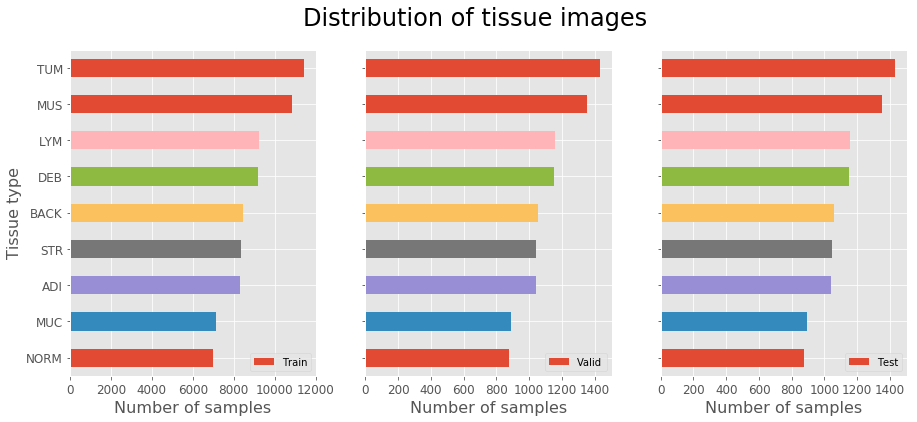

In [8]:
# Plot number of samples for each class in train_dir

# Path to all three directories
train_dir = os.path.join(data_dir, 'train')
valid_dir = os.path.join(data_dir, 'val')
test_dir = os.path.join(data_dir, 'test')

# Tissue classes list
class_ = os.listdir(train_dir)

# Instantiate empty lists to add the number of samples
trn_num_samples = []
val_num_samples = []
test_num_samples = []

# Count the number of samples in train_dir
for dir_ in [train_dir, valid_dir, test_dir]:
    if dir_ == train_dir:
        for dir_ in os.listdir(dir_):
            trn_num_samples.append(len(os.listdir(os.path.join(train_dir, dir_))))

    elif dir_ == valid_dir:
        for dir_ in os.listdir(dir_):
            val_num_samples.append(len(os.listdir(os.path.join(valid_dir, dir_))))
    
    else:
        for dir_ in os.listdir(dir_):
            test_num_samples.append(len(os.listdir(os.path.join(test_dir, dir_))))

# Make a dataframe with the computed stats 
# Step 1: Make a dictionary and populate the dictionary
stats = {}
stats['Tissue_type'] = class_
stats['Train'] = trn_num_samples
stats['Valid'] = val_num_samples
stats['Test'] = test_num_samples
# Step 2: Make a dataframe and sort its values based on train data 
df = pd.DataFrame(stats).sort_values(['Train'], ascending=True)


# Plot the data
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15,6), sharey=True)
fig.suptitle("Distribution of tissue images", fontsize=24)

df.plot(kind='barh', x="Tissue_type", y='Train', ax = ax1, fontsize=12)
ax1.set_xlabel('Number of samples', fontsize=16)
ax1.set_ylabel('Tissue type', fontsize=16)

df.plot(kind='barh', x="Tissue_type", y='Valid', ax = ax2, fontsize=12)
ax2.set_xlabel('Number of samples', fontsize=16)

df.plot(kind='barh', x="Tissue_type", y='Test', ax = ax3, fontsize=12)
ax3.set_xlabel('Number of samples', fontsize=16)


# Data Augmentation and EDA

Data augmentation is a strategy that adds noise and increase the diversity of the training data. It is a form of regularization and generalizes tbe model.  

The method purposely perturbs training examples, changing their appearance slightly, before passing them into the network for training. This partially alleviates the need to gather more training data.

Initialize each of our generators with data augmentation techniques such as horizontal flipping, vertical flipping, shear, rotation and shift are commonly used to train large neural networks.

In [9]:
# Data Augmentation
train_datagen = ImageDataGenerator(rescale=1./255.,
                                   horizontal_flip=True,
                                   vertical_flip=True,
                                   shear_range=0.4,
                                   width_shift_range=0.25,
                                   height_shift_range=0.25,
                                   rotation_range=45,
                                   fill_mode='nearest')
valid_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [2]:
# Train ImageDataGenerator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size = 64,
                                                    target_size = (224,224),
                                                    class_mode = 'categorical',
                                                    shuffle=True,
                                                    seed=42,
                                                    color_mode='rgb')

valid_generator = valid_datagen.flow_from_directory(valid_dir,
                                                    batch_size=64,
                                                    target_size=(224,224),
                                                    class_mode='categorical',
                                                    shuffle=True,
                                                    seed=42,
                                                    color_mode='rgb')

test_generator = test_datagen.flow_from_directory(test_dir,
                                                batch_size=1,
                                                target_size=(224,224),
                                                class_mode='categorical',
                                                shuffle=False,
                                                seed=42,
                                                color_mode='rgb')

# Plot images for each class

In [13]:
# Test data
filenames = test_generator.filenames
nb_samples = len(filenames)

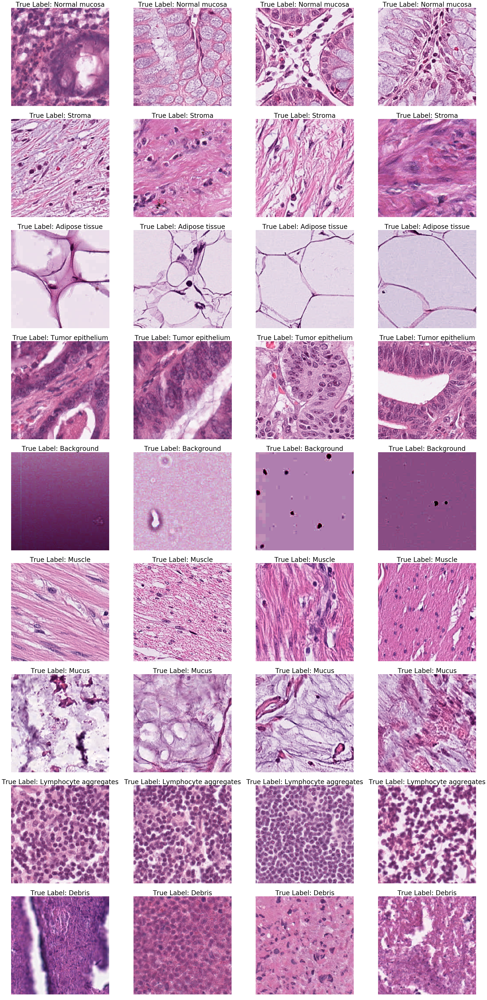

In [11]:
# Get model class_labels and inverted class_labels as class_names
class_labels = train_generator.class_indices
class_names = {value:key for key,value in class_labels.items()}

# Tissue types dictionary mapping class names with full names
tissue_types = {"ADI": "Adipose tissue",
               "BACK": "Background",
               "DEB": "Debris",
               "LYM": "Lymphocyte aggregates",
               "MUC": "Mucus", 
               "MUS": "Muscle",
               "NORM": "Normal mucosa", 
               "STR": "Stroma",
               "TUM": "Tumor epithelium"}

# List of images to plot: 4 images from each class in the training data
images_to_plot = [os.path.join(train_dir, subdir_, fname) for subdir_ in os.listdir(train_dir) for fname in os.listdir(os.path.join(train_dir, subdir_))[:4]]

fig = plt.figure(figsize=(30,60))
fig.subplots_adjust(top=0.88)
columns = 4
rows = 9

for i in range(1, columns*rows+1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(mpimg.imread(images_to_plot[i-1]))
    plt.axis('off')
    title = images_to_plot[i-1].split('/')[-2]
    plt.title("True Label: {}".format(tissue_types[title]), fontsize=28)
    plt.tight_layout()
    
plt.show()

# VGG19 models
We will use a pre-trained VGG19 model for this multiclass classification task with weights from ImageNet trained on a very large, very popular dataset used for image classification and other vision tasks.

## VGG19 training cycle #1

In [12]:
# Instantiate the vgg19 model without the top classifier. 
base_model = VGG19(input_shape=(224, 224, 3), weights='imagenet', include_top = False)

# Add a classifier to the convolution block classifier
x = base_model.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

# Define the model
model_vgg19_01 = Model(base_model.inputs, output)

# Freeze all layers in the convolution block. We don't want to train these weights yet.
for layer in base_model.layers:
        layer.trainable=False
        
#model_vgg19_01.summary()

# Call Backs
filepath = 'vgg19_base_model_wt.h5'
es = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

# Compile a model
model_vgg19_01.compile(loss="categorical_crossentropy", optimizer=Adam(lr=0.0001), metrics=["accuracy"])

80142336/80134624 [==============================] - 8s 0us/step


In [22]:
# Model fitting
history_01 = model_vgg19_01.fit_generator(
            train_generator,
            steps_per_epoch=225,
            epochs=10,
            callbacks = [es, cp],
            validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 1s - loss: 1.3172 - acc: 0.5526
Epoch 00001: val_loss improved from inf to 0.78447, saving model to vgg19_base_model_wt.h5
225/225 [==============================] - 356s 2s/step - loss: 1.3160 - acc: 0.5531 - val_loss: 0.7845 - val_acc: 0.7819
Epoch 2/10
224/225 [============================>.] - ETA: 1s - loss: 0.8999 - acc: 0.6857
Epoch 00002: val_loss improved from 0.78447 to 0.61613, saving model to vgg19_base_model_wt.h5
225/225 [==============================] - 341s 2s/step - loss: 0.8995 - acc: 0.6860 - val_loss: 0.6161 - val_acc: 0.8023
Epoch 3/10
224/225 [============================>.] - ETA: 1s - loss: 0.7693 - acc: 0.7302
Epoch 00003: val_loss improved from 0.61613 to 0.54349, saving model to vgg19_base_model_wt.h5
225/225 [==============================] - 342s 2s/step - loss: 0.7688 - acc: 0.7304 - val_loss: 0.5435 - val_acc: 0.8150
Epoch 4/10
224/225 [============================>.] - ETA: 1s - loss: 0.6945 - a

In [23]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_vgg19_01.save_weights(filepath='model_weights/vgg19_base_model_wt.h5', overwrite=True)

### Model Evaluation: training round #1

In [24]:
# Load the saved model
model_vgg19_01.load_weights('vgg19_base_model_wt.h5')
# Evaluate the model on the hold out validation and test datasets

vgg_val_eval_01 = model_vgg19_01.evaluate_generator(valid_generator)
vgg_test_eval_01 = model_vgg19_01.evaluate_generator(test_generator)

print('Validation loss:     {}'.format(vgg_val_eval_01[0]))
print('Validation accuracy: {}'.format(vgg_val_eval_01[1]))
print('Test loss:           {}'.format(vgg_test_eval_01[0]))
print('Test accuracy:       {}'.format(vgg_test_eval_01[1]))

# Predict probabilities
vgg_predictions_01 = model_vgg19_01.predict_generator(test_generator,steps = nb_samples,verbose=1)

# Predict labels
vgg_pred_labels_01 = np.argmax(vgg_predictions_01, axis=1)

# Classification Report
print('|'+'-'*75+'|')
print('|-------------------Classification Report: Training Cycle #1----------------|')
print('|'+'-'*75+'|')
print(classification_report(test_generator.classes, vgg_pred_labels_01, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))


Validation loss:     0.39513784623730475
Validation accuracy: 0.8562281140749188
Test loss:           0.39212003798260864
Test accuracy:       0.8612526221156728
10011/10011 [==============================] - 307s 31ms/step
|---------------------------------------------------------------------------|
|-------------------Classification Report: Training Cycle #1----------------|
|---------------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       0.99      0.97      0.98      1042
        BACK       0.96      0.99      0.97      1058
         DEB       0.87      0.79      0.83      1152
         LYM       0.93      0.97      0.95      1157
         MUC       0.87      0.85      0.86       891
         MUS       0.88      0.71      0.78      1355
        NORM       0.87      0.78      0.83       877
         STR       0.65      0.85      0.74      1046
         TUM       0.81      0.86      0.84      1433



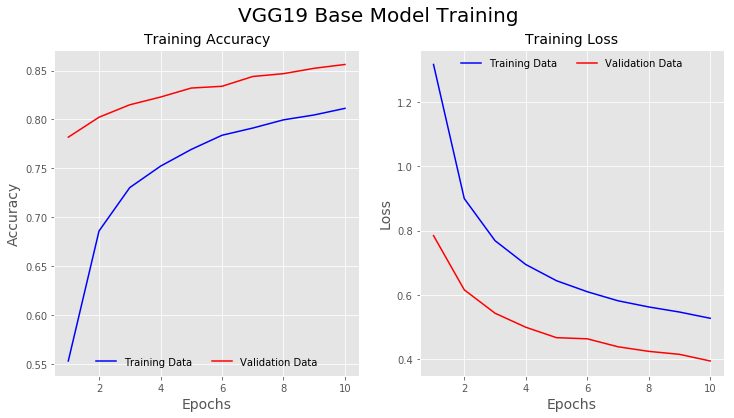

In [25]:
# Plot performance of vgg19 base model
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("VGG19 Base Model Training", fontsize=20)
max_epoch = len(history_01.history['acc'])+1
epochs_list = list(range(1, max_epoch))

ax1.plot(epochs_list, history_01.history['acc'], color='b', linestyle='-', label='Training Data')
ax1.plot(epochs_list, history_01.history['val_acc'], color='r', linestyle='-', label ='Validation Data')
ax1.set_title('Training Accuracy', fontsize=14)
ax1.set_xlabel('Epochs', fontsize=14)
ax1.set_ylabel('Accuracy', fontsize=14)
ax1.legend(frameon=False, loc='lower center', ncol=2)

ax2.plot(epochs_list, history_01.history['loss'], color='b', linestyle='-', label='Training Data')
ax2.plot(epochs_list, history_01.history['val_loss'], color='r', linestyle='-', label ='Validation Data')
ax2.set_title('Training Loss', fontsize=14)
ax2.set_xlabel('Epochs', fontsize=14)
ax2.set_ylabel('Loss', fontsize=14)
ax2.legend(frameon=False, loc='upper center', ncol=2)

## Fine tuning VGG19 model Round 2

In [26]:
# Construct VGG19 model without the classifer and weights trained on imagenet data
base_model_02 = VGG19(input_shape=(224, 224, 3),
                 include_top = False)
x = base_model_02.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_vgg19_02 = Model(base_model_02.inputs, output)
# Load weights from the trained base model
model_vgg19_02.load_weights('vgg19_base_model.h5')


# Freeze layers upto the 19th layer.
for layer in model_vgg19_02.layers[:19]:
    layer.trainable =  False
    
# Call Backs
filepath = 'vgg19_model_wt_ft_01.h5'
es = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

#print(model_vgg19_02.summary())

model_vgg19_02.compile(loss="categorical_crossentropy", optimizer=Adam(lr=0.0001), metrics=["accuracy"])

In [41]:
# Model fitting
history_02 = model_vgg19_02.fit_generator(
            train_generator,
            steps_per_epoch=225,
            epochs=10,
            callbacks = [es, cp],
            validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 1s - loss: 0.4657 - acc: 0.8368
Epoch 00001: val_loss improved from inf to 0.31568, saving model to vgg19_model_wt_ft_01.h5
225/225 [==============================] - 356s 2s/step - loss: 0.4660 - acc: 0.8367 - val_loss: 0.3157 - val_acc: 0.8888
Epoch 2/10
224/225 [============================>.] - ETA: 1s - loss: 0.4023 - acc: 0.8582
Epoch 00002: val_loss improved from 0.31568 to 0.28468, saving model to vgg19_model_wt_ft_01.h5
225/225 [==============================] - 343s 2s/step - loss: 0.4024 - acc: 0.8582 - val_loss: 0.2847 - val_acc: 0.9026
Epoch 3/10
224/225 [============================>.] - ETA: 1s - loss: 0.3661 - acc: 0.8709
Epoch 00003: val_loss improved from 0.28468 to 0.27990, saving model to vgg19_model_wt_ft_01.h5
225/225 [==============================] - 343s 2s/step - loss: 0.3663 - acc: 0.8708 - val_loss: 0.2799 - val_acc: 0.9021
Epoch 4/10
224/225 [============================>.] - ETA: 1s - loss: 0.3478 

In [42]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_vgg19_02.save_weights(filepath='model_weights/vgg19_model_wt_ft_01.h5', overwrite=True)

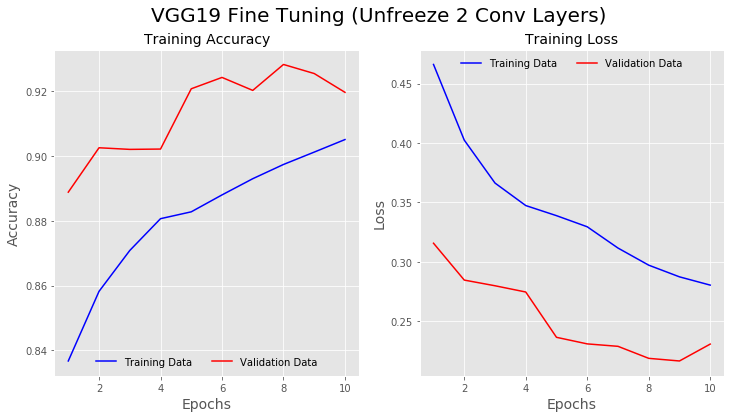

In [44]:
# Plot performance of vgg19 finetune model
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("VGG19 Fine Tuning (Unfreeze 2 Conv Layers)", fontsize=20)
max_epoch = len(history_02.history['acc'])+1
epochs_list = list(range(1, max_epoch))

ax1.plot(epochs_list, history_02.history['acc'], color='b', linestyle='-', label='Training Data')
ax1.plot(epochs_list, history_02.history['val_acc'], color='r', linestyle='-', label ='Validation Data')
ax1.set_title('Training Accuracy', fontsize=14)
ax1.set_xlabel('Epochs', fontsize=14)
ax1.set_ylabel('Accuracy', fontsize=14)
ax1.legend(frameon=False, loc='lower center', ncol=2)

ax2.plot(epochs_list, history_02.history['loss'], color='b', linestyle='-', label='Training Data')
ax2.plot(epochs_list, history_02.history['val_loss'], color='r', linestyle='-', label ='Validation Data')
ax2.set_title('Training Loss', fontsize=14)
ax2.set_xlabel('Epochs', fontsize=14)
ax2.set_ylabel('Loss', fontsize=14)
ax2.legend(frameon=False, loc='upper center', ncol=2)

### Model Evaluation: training round #2

In [27]:
# Load the saved model
model_vgg19_02.load_weights('vgg19_model_wt_ft_01.h5')
# Evaluate the model on the hold out validation and test datasets

vgg_val_eval_02 = model_vgg19_02.evaluate_generator(valid_generator)
vgg_test_eval_02 = model_vgg19_02.evaluate_generator(test_generator)

print('Validation loss:     {0:.3f}'.format(vgg_val_eval_02[0]))
print('Validation accuracy: {0:.3f}'.format(vgg_val_eval_02[1]))
print('Test loss:           {0:.3f}'.format(vgg_test_eval_02[0]))
print('Test accuracy:       {0:.3f}'.format(vgg_test_eval_02[1]))

# Predict probabilities
vgg_predictions_02 = model_vgg19_02.predict_generator(test_generator,steps = nb_samples,verbose=1)

# Predict labels
vgg_pred_labels_02 = np.argmax(vgg_predictions_02, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|------------Classification Report: VGG19 Training Cycle #2-----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, vgg_pred_labels_02, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

Validation loss:     0.217
Validation accuracy: 0.925
Test loss:           0.209
Test accuracy:       0.930
10011/10011 [==============================] - 308s 31ms/step
|-------------------------------------------------------------------|
|---------------Classification Report: Training Cycle #2------------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       0.99      0.98      0.98      1042
        BACK       0.98      0.99      0.99      1058
         DEB       0.93      0.94      0.93      1152
         LYM       0.98      0.98      0.98      1157
         MUC       0.90      0.93      0.91       891
         MUS       0.94      0.85      0.89      1355
        NORM       0.91      0.94      0.92       877
         STR       0.81      0.88      0.84      1046
         TUM       0.94      0.91      0.92      1433

   micro avg       0.93      0.93      0.93     10011
   macro avg       0.93 

## Fine Tuning the Entire VGG19 Network

In [28]:
# Build VGG19
base_model_03 = VGG19(input_shape=(224, 224, 3),
                 include_top = False)
x = base_model_03.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_vgg19_03 = Model(base_model_03.inputs, output)
# Load the weights saved after the first round of fine tuning
model_vgg19_03.load_weights('vgg19_model_wt_ft_01.h5')

# Callbacks
filepath = 'vgg19_model_finetuned.h5'

cp = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', 
                                            patience=3, 
                                            verbose=1, 
                                            factor=0.5, 
                                            min_lr=0.0001)

model_vgg19_03.compile(loss="categorical_crossentropy", optimizer=Adam(lr=0.0001), metrics=["accuracy"])

In [17]:
# Model Fitting
history_03 = model_vgg19_03.fit_generator(
            train_generator,
            steps_per_epoch=225,
            epochs=25,
            callbacks = [learning_rate_reduction, cp],
            validation_data = valid_generator)

Epoch 1/25
224/225 [============================>.] - ETA: 2s - loss: 0.2860 - acc: 0.9093
Epoch 00001: val_loss improved from inf to 0.16573, saving model to vgg19_model_finetuned.h5
225/225 [==============================] - 570s 3s/step - loss: 0.2862 - acc: 0.9093 - val_loss: 0.1657 - val_acc: 0.9492
Epoch 2/25
224/225 [============================>.] - ETA: 1s - loss: 0.1675 - acc: 0.9472
Epoch 00002: val_loss improved from 0.16573 to 0.11220, saving model to vgg19_model_finetuned.h5
225/225 [==============================] - 429s 2s/step - loss: 0.1670 - acc: 0.9473 - val_loss: 0.1122 - val_acc: 0.9656
Epoch 3/25
224/225 [============================>.] - ETA: 1s - loss: 0.1406 - acc: 0.9564
Epoch 00003: val_loss improved from 0.11220 to 0.09470, saving model to vgg19_model_finetuned.h5
225/225 [==============================] - 405s 2s/step - loss: 0.1409 - acc: 0.9564 - val_loss: 0.0947 - val_acc: 0.9719
Epoch 4/25
224/225 [============================>.] - ETA: 1s - loss: 0.12

In [18]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_vgg19_03.save_weights(filepath='model_weights/vgg19_model_finetuned.h5', overwrite=True)

In [19]:
model_vgg19_03.save("vgg19_model_finetuned.h5")

### Model Evaluation: final model

In [29]:
# Load the saved model
model_vgg19_03.load_weights('vgg19_model_finetuned.h5')
# Evaluate the model on the hold out validation and test datasets

vgg_val_eval_03 = model_vgg19_03.evaluate_generator(valid_generator)
vgg_test_eval_03 = model_vgg19_03.evaluate_generator(test_generator)

print('Validation loss:       {0:.3f}'.format(vgg_val_eval_03[0]))
print('Validation accuracy:   {0:.3f}'.format(vgg_val_eval_03[1]))
print('Test loss:             {0:.3f}'.format(vgg_test_eval_03[0]))
print('Test accuracy:         {0:.3f}'.format(vgg_test_eval_03[1]))

# Predict probabilities
vgg_predictions_03 = model_vgg19_03.predict_generator(test_generator,steps = nb_samples, verbose=1)
# Predict labels
vgg_pred_labels_03 = np.argmax(vgg_predictions_03, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|------------Classification Report: VGG19 Training Cycle #3-----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, vgg_pred_labels_03, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

Validation loss:       0.032
Validation accuracy:   0.990
Test loss:             0.031
Test accuracy:         0.991
10011/10011 [==============================] - 308s 31ms/step
|-------------------------------------------------------------------|
|------------Classification Report: VGG19 Training Cycle #3-----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       1.00      0.99      1.00      1042
        BACK       1.00      1.00      1.00      1058
         DEB       0.99      0.99      0.99      1152
         LYM       1.00      0.99      1.00      1157
         MUC       0.99      0.98      0.98       891
         MUS       0.98      1.00      0.99      1355
        NORM       0.99      0.99      0.99       877
         STR       0.98      0.98      0.98      1046
         TUM       0.99      1.00      0.99      1433

   micro avg       0.99      0.99      0.99     10011
   macro avg  

### Plot Confusion Matrices of all the training rounds

(8.9, -0.1)

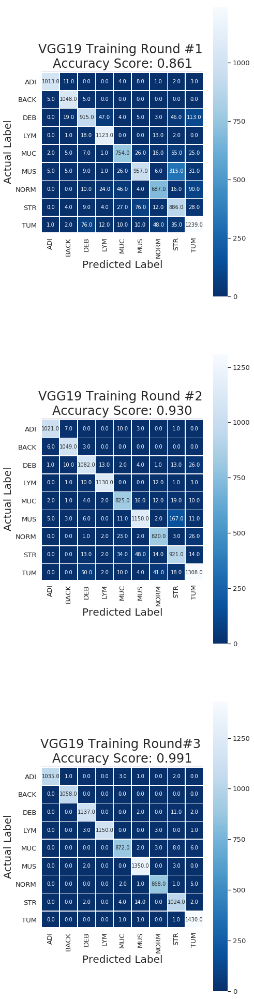

In [33]:
# Confusion Matrices
vgg_conf_mat_01 = pd.DataFrame(confusion_matrix(test_generator.classes, vgg_pred_labels_01), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])


vgg_conf_mat_02 = pd.DataFrame(confusion_matrix(test_generator.classes, vgg_pred_labels_02), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])


vgg_conf_mat_03 = pd.DataFrame(confusion_matrix(test_generator.classes, vgg_pred_labels_03), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

# Plotting Confusion Matrices
sns.set(font_scale=1.2)
fig, (ax1,ax2, ax3) = plt.subplots(nrows=3, ncols=1, figsize=(7,35))

#ax1
sns.heatmap(vgg_conf_mat_01, ax=ax1, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 10})
ax1.set_ylabel("Actual Label", fontsize=20)
ax1.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="VGG19 Training Round #1 \nAccuracy Score: {0:.3f}".format(vgg_test_eval_01[1])
ax1.set_title(all_sample_title, size=24)
ax1.set_ylim(len(vgg_conf_mat_01)-0.1, -0.1)

#ax2
sns.heatmap(vgg_conf_mat_02, ax=ax2, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 10})
ax2.set_ylabel("Actual Label", fontsize=20)
ax2.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="VGG19 Training Round #2 \nAccuracy Score: {0:.3f}".format(vgg_test_eval_02[1])
ax2.set_title(all_sample_title, size=24)
ax2.set_ylim(len(vgg_conf_mat_02)-0.1, -0.1)

#ax3
sns.heatmap(vgg_conf_mat_03, ax=ax3, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 10})
ax3.set_ylabel("Actual Label", fontsize=20)
ax3.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="VGG19 Training Round#3 \nAccuracy Score: {0:.3f}".format(vgg_test_eval_03[1])
ax3.set_title(all_sample_title, size=24)
ax3.set_ylim(len(vgg_conf_mat_03)-0.1, -0.1)


In [3]:
from itertools import chain

# training_accuracy
training_accuracy = []
training_accuracy.append(history_01.history['acc'])
training_accuracy.append(history_02.history['acc'])
training_accuracy.append(history_03.history['acc'])
training_accuracy_ = list(itertools.chain(*training_accuracy))

# training_loss
training_loss = []
training_loss.append(history_01.history['loss'])
training_loss.append(history_02.history['loss'])
training_loss.append(history_03.history['loss'])
training_loss_ = list(itertools.chain(*training_loss))

# validation_accuracy
validation_accuracy = []
validation_accuracy.append(history_01.history['val_acc'])
validation_accuracy.append(history_02.history['val_acc'])
validation_accuracy.append(history_03.history['val_acc'])
validation_accuracy_ = list(itertools.chain(*validation_accuracy))

# validation_loss
validation_loss = []
validation_loss.append(history_01.history['val_loss'])
validation_loss.append(history_02.history['val_loss'])
validation_loss.append(history_03.history['val_loss'])
validation_loss_ = list(itertools.chain(*validation_loss))

training_metrics_df = pd.DataFrame({'training_accuracy': training_accuracy_,
                                   'training_loss': training_loss_,
                                   'validation_accuracy': validation_accuracy_,
                                   'validation_loss': validation_loss_})
training_metrics_df.to_csv('training_metrics_03.csv', index=False)

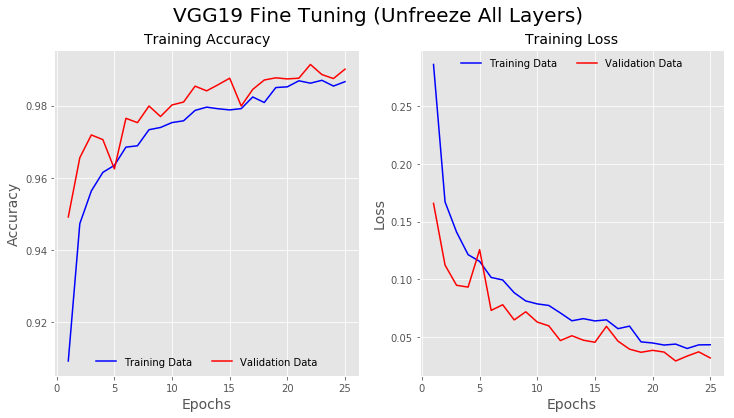

In [20]:
# Plot performance of vgg19 finetune model
fig, (ax1,ax2) = plt.subplots(nrows=1, ncols=2, figsize=(12,6))
fig.suptitle("VGG19 Fine Tuning (Unfreeze All Layers)", fontsize=20)
max_epoch = len(history_03.history['acc'])+1
epochs_list = list(range(1, max_epoch))

ax1.plot(epochs_list, history_03.history['acc'], color='b', linestyle='-', label='Training Data')
ax1.plot(epochs_list, history_03.history['val_acc'], color='r', linestyle='-', label ='Validation Data')
ax1.set_title('Training Accuracy', fontsize=14)
ax1.set_xlabel('Epochs', fontsize=14)
ax1.set_ylabel('Accuracy', fontsize=14)
ax1.legend(frameon=False, loc='lower center', ncol=2)

ax2.plot(epochs_list, history_03.history['loss'], color='b', linestyle='-', label='Training Data')
ax2.plot(epochs_list, history_03.history['val_loss'], color='r', linestyle='-', label ='Validation Data')
ax2.set_title('Training Loss', fontsize=14)
ax2.set_xlabel('Epochs', fontsize=14)
ax2.set_ylabel('Loss', fontsize=14)
ax2.legend(frameon=False, loc='upper center', ncol=2)

# MobileNet Models

## Training cycle #1

In [34]:
# Create the base model from the pre-trained model MobileNet V2
base_model_mobilenetv2_01 = MobileNet(input_shape=(224,224,3),
                                      include_top=False)

for layer in base_model_mobilenetv2_01.layers:
    layer.trainable=False

# Add the top classification block
x = base_model_mobilenetv2_01.output
flat = GlobalAveragePooling2D()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_mobilenet_01 = Model(base_model_mobilenetv2_01.inputs, output)
model_mobilenet_01.summary()

# Call Backs
filepath = 'mobilenet_base_model_wt.h5'
es_01 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_01 = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

model_mobilenet_01.compile(loss="categorical_crossentropy", optimizer=Adam(lr = 0.0004), metrics=["accuracy"])

17227776/17225924 [==============================] - 1s 0us/step


In [10]:
mobilenetv2_history_01 = model_mobilenet_01.fit_generator(train_generator,
                                                          steps_per_epoch=225,
                                                          epochs=10,
                                                          callbacks = [es_01, cp_01],
                                                          validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 1s - loss: 0.5531 - acc: 0.8151
Epoch 00001: val_loss improved from inf to 1.26521, saving model to mobilenet_base_model_wt.h5
225/225 [==============================] - 344s 2s/step - loss: 0.5525 - acc: 0.8152 - val_loss: 1.2652 - val_acc: 0.5834
Epoch 2/10
224/225 [============================>.] - ETA: 1s - loss: 0.3462 - acc: 0.8857
Epoch 00002: val_loss improved from 1.26521 to 0.98437, saving model to mobilenet_base_model_wt.h5
225/225 [==============================] - 264s 1s/step - loss: 0.3460 - acc: 0.8859 - val_loss: 0.9844 - val_acc: 0.6626
Epoch 3/10
224/225 [============================>.] - ETA: 0s - loss: 0.3032 - acc: 0.8986
Epoch 00003: val_loss did not improve from 0.98437
225/225 [==============================] - 256s 1s/step - loss: 0.3040 - acc: 0.8985 - val_loss: 1.1958 - val_acc: 0.6157
Epoch 4/10
224/225 [============================>.] - ETA: 0s - loss: 0.2778 - acc: 0.9071
Epoch 00004: val_loss did

In [13]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_mobilenet_01.save_weights(filepath='model_weights/mobilenet_base_model_wt.h5', 
                               overwrite=True)

### MobileNet Model Evaluation - training cycle #1

In [35]:
# Load the saved model
model_mobilenet_01.load_weights('mobilenet_base_model_wt.h5')

# Evaluate the model on the hold out validation and test datasets
mn_val_eval_01 = model_mobilenet_01.evaluate_generator(valid_generator)
mn_test_eval_01 = model_mobilenet_01.evaluate_generator(test_generator)

print('Validation loss:      {0:.3f}'.format(mn_val_eval_01[0]))
print('Validation accuracy:  {0:.3f}'.format(mn_val_eval_01[1]))
print('Test loss:            {0:.3f}'.format(mn_test_eval_01[0]))
print('Test accuracy:        {0:.3f}'.format(mn_test_eval_01[1]))

# Prediction Probabilities
mn_predictions_01 = model_mobilenet_01.predict_generator(test_generator,steps = nb_samples, verbose=1)
# Prediction Labels
mn_pred_labels_01 = np.argmax(mn_predictions_01, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: MobileNet Training Cycle #1-----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, mn_pred_labels_01, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

Validation loss:      0.984
Validation accuracy:  0.663
Test loss:            0.999
Test accuracy:        0.662
10011/10011 [==============================] - 93s 9ms/step
|-------------------------------------------------------------------|
|----------Classification Report: MobileNet Training Cycle #1-----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       0.94      0.98      0.96      1042
        BACK       0.93      0.98      0.96      1058
         DEB       0.45      0.87      0.59      1152
         LYM       0.70      0.97      0.81      1157
         MUC       0.94      0.14      0.25       891
         MUS       0.60      0.86      0.71      1355
        NORM       0.96      0.36      0.52       877
         STR       0.44      0.53      0.48      1046
         TUM       0.97      0.18      0.31      1433

   micro avg       0.66      0.66      0.66     10011
   macro avg      

In [126]:

# Prediction Probabilities
mn_predictions_01 = model_mobilenet_01.predict_generator(test_generator,steps = nb_samples, verbose=1)
# Prediction Labels
mn_pred_labels_01 = np.argmax(mn_predictions_01, axis=1)

10011/10011 [==============================] - 2339s 234ms/step


In [47]:
# Classification Report
print(classification_report(test_generator.classes, mn_pred_labels_01, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

              precision    recall  f1-score   support

         ADI       0.88      0.98      0.93      1042
        BACK       0.82      0.98      0.89      1058
         DEB       0.52      0.63      0.57      1152
         LYM       0.68      0.98      0.80      1157
         MUC       0.94      0.16      0.27       891
         MUS       0.76      0.79      0.77      1355
        NORM       0.95      0.65      0.77       877
         STR       0.47      0.81      0.59      1046
         TUM       0.96      0.37      0.53      1433

    accuracy                           0.71     10011
   macro avg       0.78      0.71      0.68     10011
weighted avg       0.77      0.71      0.68     10011



## MobileNet - training cycle #2

In [36]:
# Build a model
base_model_mobilenet_02 = MobileNet(input_shape=(224, 224, 3),
                                    include_top = False)
x = base_model_mobilenet_02.output
flat = GlobalAveragePooling2D()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)
model_mobilenet_02= Model(base_model_mobilenet_02.inputs, output)

# Load weights from the previous traning session
model_mobilenet_02.load_weights('model_weights/mobilenet_base_model_wt.h5')

# Freeze layers
for layer in model_mobilenet_02.layers[:82]:
    layer.trainable=False
    
# Call Backs
filepath = 'mobilenet_model_02_wt.h5'
es_02 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_02 = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

# compile a model
model_mobilenet_02.compile(loss="categorical_crossentropy", optimizer=Adam(lr = 0.0004), metrics=["accuracy"])

In [19]:
mobilenetv2_history_02 = model_mobilenet_02.fit_generator(train_generator,
                                                          steps_per_epoch=225,
                                                          epochs=25,
                                                          callbacks = [es_02, cp_02],
                                                          validation_data = valid_generator)

Epoch 1/25
224/225 [============================>.] - ETA: 0s - loss: 0.2488 - acc: 0.9196
Epoch 00001: val_loss improved from inf to 1.44079, saving model to mobilenet_model_02_wt.h5
225/225 [==============================] - 215s 954ms/step - loss: 0.2485 - acc: 0.9197 - val_loss: 1.4408 - val_acc: 0.6289
Epoch 2/25
224/225 [============================>.] - ETA: 0s - loss: 0.1867 - acc: 0.9385
Epoch 00002: val_loss did not improve from 1.44079
225/225 [==============================] - 200s 891ms/step - loss: 0.1868 - acc: 0.9385 - val_loss: 1.4891 - val_acc: 0.6550
Epoch 3/25
224/225 [============================>.] - ETA: 0s - loss: 0.1672 - acc: 0.9445
Epoch 00003: val_loss did not improve from 1.44079
225/225 [==============================] - 205s 910ms/step - loss: 0.1676 - acc: 0.9442 - val_loss: 5.5714 - val_acc: 0.3410
Epoch 4/25
224/225 [============================>.] - ETA: 0s - loss: 0.1566 - acc: 0.9535
Epoch 00004: val_loss improved from 1.44079 to 1.18062, saving mod

In [23]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_mobilenet_02.save_weights(filepath='mobilenet_model_02.h5', 
                               overwrite=True)

### MobileNet Model Evaluation - training cycle #2

In [37]:
# Load the saved model
model_mobilenet_02.load_weights('mobilenet_model_02.h5')
# Evaluate the model on the hold out validation and test datasets

mn_val_eval_02 = model_mobilenet_02.evaluate_generator(valid_generator)
mn_test_eval_02 = model_mobilenet_02.evaluate_generator(test_generator)

print('Validation loss:     {}'.format(mn_val_eval_02[0]))
print('Validation accuracy: {}'.format(mn_val_eval_02[1]))
print('Test loss:           {}'.format(mn_test_eval_02[0]))
print('Test accuracy:       {}'.format(mn_test_eval_02[1]))

# Prediction Probabilities
mn_predictions_02 = model_mobilenet_02.predict_generator(test_generator,steps = nb_samples, verbose=1)
# Prediction Labels
mn_pred_labels_02 = np.argmax(mn_predictions_02, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: MobileNet Training Cycle #2-----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, mn_pred_labels_02, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

Validation loss:     2.0009217870062503
Validation accuracy: 0.6036018008944868
Test loss:           2.034683074022393
Test accuracy:       0.5980421536310059
10011/10011 [==============================] - 92s 9ms/step
|-------------------------------------------------------------------|
|-------Classification Report: MobileNet Training Cycle #2-----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       0.99      0.84      0.91      1042
        BACK       1.00      0.06      0.11      1058
         DEB       0.37      0.98      0.53      1152
         LYM       0.96      0.82      0.88      1157
         MUC       0.00      0.00      0.00       891
         MUS       0.55      0.96      0.70      1355
        NORM       0.94      0.71      0.81       877
         STR       0.43      0.66      0.52      1046
         TUM       0.98      0.25      0.40      1433

   micro avg       0.60     

/usr/local/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


10011/10011 [==============================] - 1116s 111ms/step


## Fine tune the model - training cycle #3

In [38]:
base_model_mobilenet_03 = MobileNet(input_shape=(224, 224, 3),
                                    include_top = False)
x = base_model_mobilenet_03.output
flat = GlobalAveragePooling2D()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_mobilenet_03= Model(base_model_mobilenet_03.inputs, output)
model_mobilenet_03.load_weights('mobilenet_model_02_wt.h5')

# Call Backs
filepath = 'mobilenet_model_03_wt.h5'
es_03 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_03 = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

for layer in model_mobilenet_03.layers[:55]:
    layer.trainable=False
    
model_mobilenet_03.compile(optimizer = Adam(lr = 0.0004),
                          loss = 'categorical_crossentropy',
                          metrics = ['accuracy'])

In [33]:
mobilenetv2_history_03 = model_mobilenet_03.fit_generator(train_generator,
                                 steps_per_epoch=225,
                                 epochs=10,
                                 callbacks = [es_03, cp_03],
                                 validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 0s - loss: 0.1401 - acc: 0.9595
Epoch 00001: val_loss improved from inf to 1.64277, saving model to mobilenet_model_03_wt.h5
225/225 [==============================] - 223s 993ms/step - loss: 0.1408 - acc: 0.9594 - val_loss: 1.6428 - val_acc: 0.6282
Epoch 2/10
224/225 [============================>.] - ETA: 0s - loss: 0.1121 - acc: 0.9648
Epoch 00002: val_loss did not improve from 1.64277
225/225 [==============================] - 202s 900ms/step - loss: 0.1122 - acc: 0.9649 - val_loss: 3.7372 - val_acc: 0.4972
Epoch 3/10
224/225 [============================>.] - ETA: 0s - loss: 0.1029 - acc: 0.9683
Epoch 00003: val_loss improved from 1.64277 to 1.20987, saving model to mobilenet_model_03_wt.h5
225/225 [==============================] - 202s 900ms/step - loss: 0.1027 - acc: 0.9683 - val_loss: 1.2099 - val_acc: 0.7049
Epoch 4/10
224/225 [============================>.] - ETA: 0s - loss: 0.0881 - acc: 0.9716
Epoch 00004: val_los

In [34]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_mobilenet_03.save_weights(filepath='model_weights/mobilenet_model_03.h5', overwrite=True)

### Model Evaluation - training cycle 3

In [39]:
# Load the saved model
model_mobilenet_03.load_weights('mobilenet_model_03.h5')
# Evaluate the model on the hold out validation and test datasets

mn_val_eval_03 = model_mobilenet_03.evaluate_generator(valid_generator)
mn_test_eval_03 = model_mobilenet_03.evaluate_generator(test_generator)

print('Validation loss:       {}'.format(mn_val_eval_03[0]))
print('Validation accuracy:   {}'.format(mn_val_eval_03[1]))
print('Test loss:             {}'.format(mn_test_eval_03[0]))
print('Test accuracy:         {}'.format(mn_test_eval_03[1]))

# Predict probability
mn_predictions_03 = model_mobilenet_03.predict_generator(test_generator,steps = nb_samples,verbose=1)
# Prediction labels                                                  
mn_pred_labels_03 = np.argmax(mn_predictions_03, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: MobileNet Training Cycle #3----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, mn_pred_labels_03, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))



Validation loss:       0.7429567687328963
Validation accuracy:   0.77868934469619
Test loss:             0.7586841192792428
Test accuracy:         0.7762461292578164
10011/10011 [==============================] - 95s 9ms/step
|-------------------------------------------------------------------|
|-------Classification Report: MobileNet Training Cycle #3----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       0.91      0.99      0.95      1042
        BACK       0.99      0.91      0.95      1058
         DEB       0.50      1.00      0.67      1152
         LYM       0.95      0.77      0.85      1157
         MUC       0.99      0.19      0.32       891
         MUS       0.79      0.97      0.87      1355
        NORM       0.94      0.80      0.87       877
         STR       0.61      0.83      0.71      1046
         TUM       0.99      0.47      0.64      1433

   micro avg       0.7

## Fine tuning the entire model

In [40]:
base_model_mobilenet_04 = MobileNet(input_shape=(224, 224, 3),
                                    include_top = False)
x = base_model_mobilenet_04.output
flat = GlobalAveragePooling2D()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_mobilenet_final= Model(base_model_mobilenet_04.inputs, output)

# Load weights from the previous traning session
model_mobilenet_final.load_weights('mobilenet_model_03_wt.h5')

# Call Backs
filepath = 'mobilenet_model_final_wt.h5'
es_04 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_04 = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

# For the final tuning of the entire let's use Stochastic Gradient Descent and slow tuning
sgd = SGD(lr=.00001, decay=1e-6, momentum=0.9, nesterov=True)
model_mobilenet_final.compile(optimizer = sgd,
                          loss = 'categorical_crossentropy',
                          metrics = ['accuracy'])

In [40]:
mobilenetv2_history_final = model_mobilenet_final.fit_generator(train_generator,
                                 steps_per_epoch=225,
                                 epochs=50,
                                 callbacks = [es_04, cp_04],
                                 validation_data = valid_generator)

Epoch 1/50
224/225 [============================>.] - ETA: 1s - loss: 0.1093 - acc: 0.9661
Epoch 00001: val_loss improved from inf to 0.11400, saving model to mobilenet_model_final_wt.h5
225/225 [==============================] - 275s 1s/step - loss: 0.1091 - acc: 0.9662 - val_loss: 0.1140 - val_acc: 0.9647
Epoch 2/50
224/225 [============================>.] - ETA: 0s - loss: 0.0954 - acc: 0.9678
Epoch 00002: val_loss improved from 0.11400 to 0.06945, saving model to mobilenet_model_final_wt.h5
225/225 [==============================] - 250s 1s/step - loss: 0.0951 - acc: 0.9679 - val_loss: 0.0695 - val_acc: 0.9789
Epoch 3/50
224/225 [============================>.] - ETA: 0s - loss: 0.0856 - acc: 0.9736
Epoch 00003: val_loss improved from 0.06945 to 0.06162, saving model to mobilenet_model_final_wt.h5
225/225 [==============================] - 250s 1s/step - loss: 0.0858 - acc: 0.9736 - val_loss: 0.0616 - val_acc: 0.9818
Epoch 4/50
224/225 [============================>.] - ETA: 0s - l

### Model Evaluation - final training cycle

In [41]:
# Load the saved model
model_mobilenet_final.load_weights('mobilenet_model_final_wt.h5')
# Evaluate the model on the hold out validation and test datasets

mn_val_eval_final = model_mobilenet_final.evaluate_generator(valid_generator)
mn_test_eval_final = model_mobilenet_final.evaluate_generator(test_generator)

print('Validation loss:      {}'.format(mn_val_eval_final[0]))
print('Validation accuracy:  {}'.format(mn_val_eval_final[1]))
print('Test loss:            {}'.format(mn_test_eval_final[0]))
print('Test accuracy:        {}'.format(mn_test_eval_final[1]))

# Prediction probability
mn_predictions_final= model_mobilenet_final.predict_generator(test_generator,steps = nb_samples,verbose=1)
# Predict labels
mn_pred_labels_final = np.argmax(mn_predictions_final, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: MobileNet Training Cycle #3----------|')
print('|'+'-'*67+'|')

print(classification_report(test_generator.classes, mn_pred_labels_final, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

Validation loss:      0.04818461111435979
Validation accuracy:  0.9862931465732866
Test loss:            0.042017248968507656
Test accuracy:        0.9876136250124863
10011/10011 [==============================] - 96s 10ms/step
|-------------------------------------------------------------------|
|-------Classification Report: MobileNet Training Cycle #3----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       1.00      1.00      1.00      1042
        BACK       1.00      1.00      1.00      1058
         DEB       0.98      0.98      0.98      1152
         LYM       1.00      0.99      1.00      1157
         MUC       0.98      0.99      0.99       891
         MUS       0.98      0.98      0.98      1355
        NORM       0.99      0.98      0.99       877
         STR       0.97      0.97      0.97      1046
         TUM       0.98      0.99      0.99      1433

   micro avg       0

In [ ]:
## Confusion Matrices

In [42]:
mn_conf_mat_01 = pd.DataFrame(confusion_matrix(test_generator.classes, mn_pred_labels_01), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])


mn_conf_mat_02 = pd.DataFrame(confusion_matrix(test_generator.classes, mn_pred_labels_02), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])



mn_conf_mat_03 = pd.DataFrame(confusion_matrix(test_generator.classes, mn_pred_labels_03), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])


mn_conf_mat_final = pd.DataFrame(confusion_matrix(test_generator.classes, mn_pred_labels_final), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])


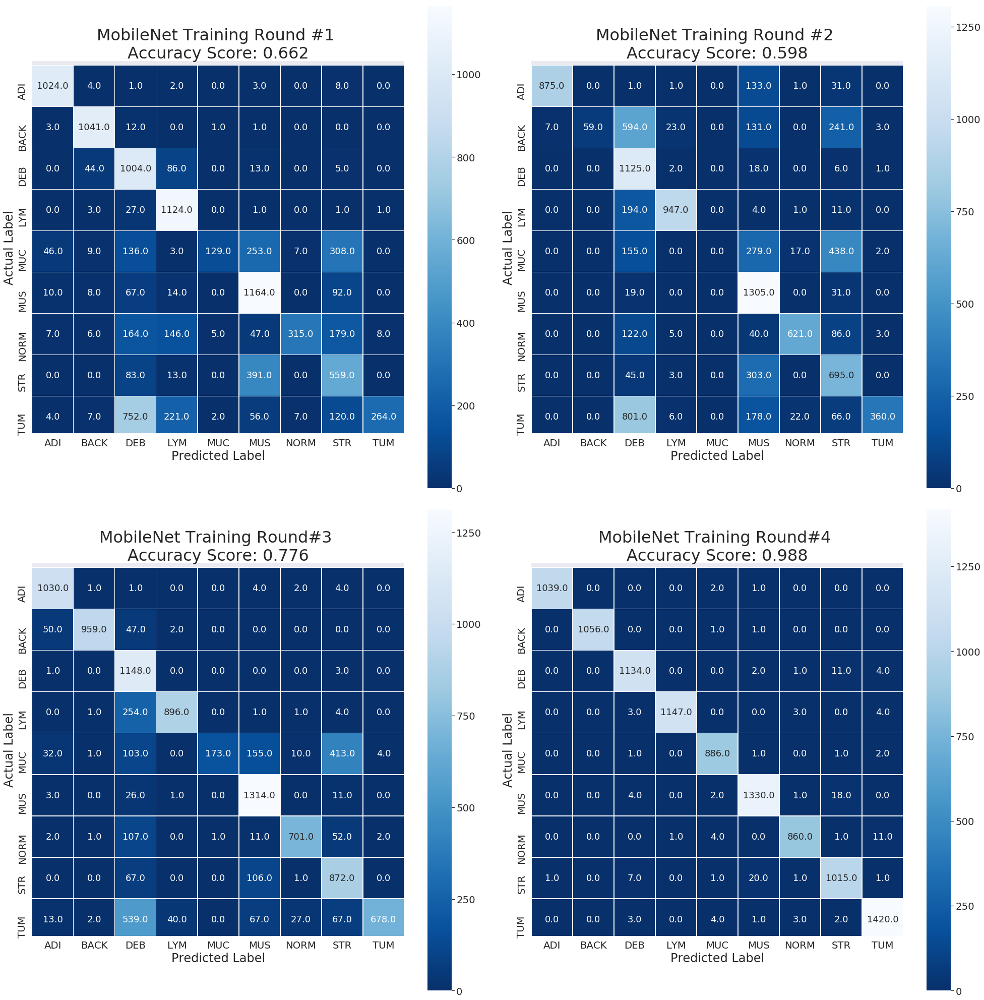

In [43]:
# Plot confusion matrices
sns.set(font_scale=1.8)
fig, ([ax1,ax2],[ax3,ax4]) = plt.subplots(nrows=2, ncols=2, figsize=(28,28))

#ax1
sns.heatmap(mn_conf_mat_01, ax=ax1, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax1.set_ylabel("Actual Label", fontsize=24)
ax1.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="MobileNet Training Round #1 \nAccuracy Score: {0:.3f}".format(mn_test_eval_01[1])
ax1.set_title(all_sample_title, size=32)
ax1.set_ylim(len(mn_conf_mat_01)-0.1, -0.1)

#ax2
sns.heatmap(mn_conf_mat_02, ax=ax2, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax2.set_ylabel("Actual Label", fontsize=24)
ax2.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="MobileNet Training Round #2 \nAccuracy Score: {0:.3f}".format(mn_test_eval_02[1])
ax2.set_title(all_sample_title, size=32)
ax2.set_ylim(len(mn_conf_mat_02)-0.1, -0.1)

#ax3
sns.heatmap(mn_conf_mat_03, ax=ax3, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax3.set_ylabel("Actual Label", fontsize=24)
ax3.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="MobileNet Training Round#3 \nAccuracy Score: {0:.3f}".format(mn_test_eval_03[1])
ax3.set_title(all_sample_title, size=32)
ax3.set_ylim(len(mn_conf_mat_03)-0.1, -0.1)

#ax4
sns.heatmap(mn_conf_mat_final, ax=ax4, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax4.set_ylabel("Actual Label", fontsize=24)
ax4.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="MobileNet Training Round#4 \nAccuracy Score: {0:.3f}".format(mn_test_eval_final[1])
ax4.set_title(all_sample_title, size=32)
ax4.set_ylim(len(mn_conf_mat_final)-0.1, -0.1)


plt.tight_layout()


# Resent50

## Training cycle #1

In [44]:
base_model_resnet50 = ResNet50(input_shape=(224,224,3),
                               include_top=False, 
                               weights='imagenet')

x = base_model_resnet50.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_resnet50_01 = Model(base_model_resnet50.inputs, output)

# Call Backs
filepath = 'resent50_base_model_wt.h5'
es = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)
# compile the model
model_resnet50_01.compile(loss="categorical_crossentropy", optimizer=Adam(lr = 0.0004), metrics=["accuracy"])

94658560/94653016 [==============================] - 5s 0us/step


In [15]:
resnet50_history_01 = model_resnet50_01.fit_generator(train_generator,
                                                      steps_per_epoch=225,
                                                      epochs=10,
                                                      callbacks = [es, cp],
                                                      validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 1s - loss: 0.3051 - acc: 0.9086
Epoch 00001: val_loss improved from inf to 12.74186, saving model to resent50_base_model_wt.h5
225/225 [==============================] - 306s 1s/step - loss: 0.3040 - acc: 0.9090 - val_loss: 12.7419 - val_acc: 0.1057
Epoch 2/10
224/225 [============================>.] - ETA: 0s - loss: 0.1916 - acc: 0.9455
Epoch 00002: val_loss improved from 12.74186 to 2.78203, saving model to resent50_base_model_wt.h5
225/225 [==============================] - 233s 1s/step - loss: 0.1928 - acc: 0.9453 - val_loss: 2.7820 - val_acc: 0.0700
Epoch 3/10
224/225 [============================>.] - ETA: 0s - loss: 0.1593 - acc: 0.9515
Epoch 00003: val_loss did not improve from 2.78203
225/225 [==============================] - 225s 999ms/step - loss: 0.1591 - acc: 0.9515 - val_loss: 6.9234 - val_acc: 0.1059
Epoch 4/10
224/225 [============================>.] - ETA: 0s - loss: 0.1331 - acc: 0.9609
Epoch 00004: val_loss

In [16]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_resnet50_01.save_weights(filepath='resent50_base_model_wt.h5', overwrite=True)

### ResNet50 Model Evaluation - training cycle #1

In [46]:
# Load the saved model
model_resnet50_01.load_weights('resent50_base_model_wt.h5')
# Evaluate the model on the hold out validation and test datasets

res_val_eval_01 = model_resnet50_01.evaluate_generator(valid_generator)
res_test_eval_01 = model_resnet50_01.evaluate_generator(test_generator)

print('Validation loss:      {}'.format(res_val_eval_01[0]))
print('Validation accuracy:  {}'.format(res_val_eval_01[1]))
print('Test loss:            {}'.format(res_test_eval_01[0]))
print('Test accuracy:        {}'.format(res_test_eval_01[1]))

# Predict probabilities
res_predictions_01 = model_resnet50_01.predict_generator(test_generator,steps = nb_samples,verbose=1)
# Predict labels
res_pred_labels_01 = np.argmax(res_predictions_01, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: ReseNet50 Training Cycle #1----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, res_pred_labels_01, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))


Validation loss:      0.26282002315290454
Validation accuracy:  0.9173586793694871
Test loss:            0.2695801589933224
Test accuracy:        0.9166916391968835
10011/10011 [==============================] - 260s 26ms/step
|-------------------------------------------------------------------|
|-------Classification Report: ReseNet50 Training Cycle #1----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       0.97      1.00      0.99      1042
        BACK       0.99      0.99      0.99      1058
         DEB       0.99      0.94      0.97      1152
         LYM       1.00      0.80      0.89      1157
         MUC       0.87      0.97      0.92       891
         MUS       0.79      0.99      0.88      1355
        NORM       0.77      0.85      0.81       877
         STR       0.97      0.71      0.82      1046
         TUM       0.96      0.97      0.96      1433

   micro avg       0.

## Fine tuning ResNet50 model - training cycle #2

In [47]:
base_model_resnet50_02 = ResNet50(input_shape=(224, 224, 3),
                                               include_top = False)
x = base_model_resnet50_02.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_resnet50_02 = Model(base_model_resnet50_02.inputs, output)
model_resnet50_02.load_weights('resent50_base_model_wt.h5')

for layer in model_resnet50_02.layers[:160]:
    layer.trainable= False
    
# Call Backs
filepath_02 = 'resent50_model_02_wt.h5'
es_02 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_02 = ModelCheckpoint(filepath, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

model_resnet50_02.compile(loss="categorical_crossentropy", optimizer=Adam(lr = 0.0004), metrics=["accuracy"])

In [23]:
resnet50_history_02 = model_resnet50_02.fit_generator(train_generator,
                                                      steps_per_epoch=225,
                                                      epochs=10,
                                                      callbacks = [es_02, cp_02],
                                                      validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 0s - loss: 0.0646 - acc: 0.9798
Epoch 00001: val_loss improved from inf to 0.37046, saving model to resent50_base_model_wt.h5
225/225 [==============================] - 207s 921ms/step - loss: 0.0648 - acc: 0.9798 - val_loss: 0.3705 - val_acc: 0.8981
Epoch 2/10
224/225 [============================>.] - ETA: 0s - loss: 0.0795 - acc: 0.9773
Epoch 00002: val_loss did not improve from 0.37046
225/225 [==============================] - 178s 792ms/step - loss: 0.0795 - acc: 0.9772 - val_loss: 0.3741 - val_acc: 0.9054
Epoch 3/10
224/225 [============================>.] - ETA: 0s - loss: 0.0618 - acc: 0.9812
Epoch 00003: val_loss improved from 0.37046 to 0.34197, saving model to resent50_base_model_wt.h5
225/225 [==============================] - 178s 792ms/step - loss: 0.0617 - acc: 0.9812 - val_loss: 0.3420 - val_acc: 0.9086
Epoch 4/10
224/225 [============================>.] - ETA: 0s - loss: 0.0576 - acc: 0.9827
Epoch 00004: val_l

In [25]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_resnet50_02.save_weights(filepath='resent50_model_02_wt.h5', overwrite=True)

### Model Evaluation - training cycle #2

In [48]:
# Load the saved model
model_resnet50_02.load_weights('resent50_model_02_wt.h5')
# Evaluate the model on the hold out validation and test datasets

res_val_eval_02 = model_resnet50_02.evaluate_generator(valid_generator)
res_test_eval_02 = model_resnet50_02.evaluate_generator(test_generator)

print('Validation loss:     {}'.format(res_val_eval_02[0]))
print('Validation accuracy: {}'.format(res_val_eval_02[1]))
print('Test loss:           {}'.format(res_test_eval_02[0]))
print('Test accuracy:       {}'.format(res_test_eval_02[1]))
print('*'*75)

# Predict probabilities
res_predictions_02 = model_resnet50_02.predict_generator(test_generator, steps = nb_samples,verbose=1)
# Predict labels
res_pred_labels_02 = np.argmax(res_predictions_02, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: ReseNet50 Training Cycle #2----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, res_pred_labels_02, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))


Validation loss:     0.408025208316844
Validation accuracy: 0.8932466233414731
Test loss:           0.413023896998032
Test accuracy:       0.8924183398261912
***************************************************************************
10011/10011 [==============================] - 262s 26ms/step
|-------------------------------------------------------------------|
|-------Classification Report: ReseNet50 Training Cycle #2----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       1.00      0.97      0.98      1042
        BACK       0.99      0.95      0.97      1058
         DEB       0.99      0.78      0.87      1152
         LYM       1.00      0.73      0.84      1157
         MUC       0.86      0.99      0.92       891
         MUS       0.79      0.99      0.88      1355
        NORM       0.70      0.97      0.81       877
         STR       0.85      0.73      0.79      1046
       

## Fine tuning model # Round 3

In [49]:
base_model_resnet50_03 = ResNet50(input_shape=(224, 224, 3),
                                               include_top = False)
x = base_model_resnet50_03.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_resnet50_03 = Model(base_model_resnet50_03.inputs, output)
model_resnet50_03.load_weights('resent50_model_02_wt.h5')

for layer in model_resnet50_03.layers[:118]:
    layer.trainable= False
    
# Call Backs
filepath_03 = 'resent50_model_03_wt.h5'
es_03 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_03 = ModelCheckpoint(filepath_03, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

model_resnet50_03.compile(loss="categorical_crossentropy", optimizer=Adam(lr = 0.0004), metrics=["accuracy"])


In [30]:
resnet50_history_03 = model_resnet50_03.fit_generator(train_generator,
                                                      steps_per_epoch=225,
                                                      epochs=10,
                                                      callbacks = [es_02, cp_02],
                                                      validation_data = valid_generator)

Epoch 1/10
224/225 [============================>.] - ETA: 0s - loss: 0.0837 - acc: 0.9754
Epoch 00001: val_loss did not improve from 0.33921
225/225 [==============================] - 191s 848ms/step - loss: 0.0835 - acc: 0.9755 - val_loss: 0.9691 - val_acc: 0.8447
Epoch 2/10
224/225 [============================>.] - ETA: 0s - loss: 0.0656 - acc: 0.9794
Epoch 00002: val_loss improved from 0.33921 to 0.22405, saving model to resent50_base_model_wt.h5
225/225 [==============================] - 206s 917ms/step - loss: 0.0653 - acc: 0.9794 - val_loss: 0.2241 - val_acc: 0.9347
Epoch 3/10
224/225 [============================>.] - ETA: 0s - loss: 0.0669 - acc: 0.9796
Epoch 00003: val_loss did not improve from 0.22405
225/225 [==============================] - 176s 781ms/step - loss: 0.0667 - acc: 0.9797 - val_loss: 0.4240 - val_acc: 0.8938
Epoch 4/10
224/225 [============================>.] - ETA: 0s - loss: 0.0558 - acc: 0.9834
Epoch 00004: val_loss did not improve from 0.22405
225/225 [=

In [ ]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_resnet50_03.save_weights(filepath='resent50_model_03_wt.h5', overwrite=True)


### ResNet50 Model Evaluation - training cyle #3

In [50]:
# Load the saved model
model_resnet50_03.load_weights('resent50_model_03_wt.h5')
# Evaluate the model on the hold out validation and test datasets

res_val_eval_03 = model_resnet50_03.evaluate_generator(valid_generator)
res_test_eval_03 = model_resnet50_03.evaluate_generator(test_generator)

print('Validation loss:     {0:.3f}'.format(res_val_eval_03[0]))
print('Validation accuracy: {0:.3f}'.format(res_val_eval_03[1]))
print('Test loss:           {0:.3f}'.format(res_test_eval_03[0]))
print('Test accuracy:       {0:.3f}'.format(res_test_eval_03[1]))

# Predict probabilities
res_predictions_03 = model_resnet50_03.predict_generator(test_generator,steps = nb_samples,verbose=1)
# Predict labels
res_pred_labels_03 = np.argmax(res_predictions_03, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: ReseNet50 Training Cycle #3----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, res_pred_labels_03, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))


Validation loss:     0.371
Validation accuracy: 0.908
Test loss:           0.380
Test accuracy:       0.908
10011/10011 [==============================] - 269s 27ms/step
|-------------------------------------------------------------------|
|-------Classification Report: ReseNet50 Training Cycle #3----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       1.00      0.97      0.99      1042
        BACK       0.99      0.95      0.97      1058
         DEB       1.00      0.91      0.95      1152
         LYM       1.00      0.83      0.91      1157
         MUC       0.90      0.97      0.93       891
         MUS       0.82      1.00      0.90      1355
        NORM       0.66      0.99      0.79       877
         STR       0.95      0.70      0.81      1046
         TUM       0.98      0.86      0.92      1433

   micro avg       0.91      0.91      0.91     10011
   macro avg       0.92 

## Fine tuning Resnet50 model training cycle #4

In [51]:
base_model_resnet50_04 = ResNet50(input_shape=(224, 224, 3),
                                               include_top = False)
x = base_model_resnet50_04.output
flat = Flatten()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)

model_resnet50_04 = Model(base_model_resnet50_04.inputs, output)
model_resnet50_04.load_weights('resent50_model_03_wt.h5')

# Call Backs
filepath_04 = 'resent50_model_04_wt.h5'
es_04 = EarlyStopping(monitor='loss', verbose=1, mode='min', patience=4)
cp_04 = ModelCheckpoint(filepath_04, monitor='val_loss',verbose=1, save_best_only=True,
                     save_weights_only=False, mode='auto', period=1)

model_resnet50_04.compile(loss="categorical_crossentropy", optimizer=Adam(lr = 0.0004), metrics=["accuracy"])


In [35]:
resnet50_history_04 = model_resnet50_04.fit_generator(train_generator,
                                                      steps_per_epoch=225,
                                                      epochs=30,
                                                      callbacks = [es_04, cp_04],
                                                      validation_data = valid_generator)

Epoch 1/30
224/225 [============================>.] - ETA: 0s - loss: 0.0434 - acc: 0.9865
Epoch 00001: val_loss improved from inf to 0.03184, saving model to resent50_model_04_wt.h5
225/225 [==============================] - 239s 1s/step - loss: 0.0432 - acc: 0.9866 - val_loss: 0.0318 - val_acc: 0.9905
Epoch 2/30
224/225 [============================>.] - ETA: 0s - loss: 0.0434 - acc: 0.9866
Epoch 00002: val_loss improved from 0.03184 to 0.02968, saving model to resent50_model_04_wt.h5
225/225 [==============================] - 180s 800ms/step - loss: 0.0433 - acc: 0.9867 - val_loss: 0.0297 - val_acc: 0.9910
Epoch 3/30
224/225 [============================>.] - ETA: 0s - loss: 0.0434 - acc: 0.9865
Epoch 00003: val_loss improved from 0.02968 to 0.02908, saving model to resent50_model_04_wt.h5
225/225 [==============================] - 180s 799ms/step - loss: 0.0433 - acc: 0.9865 - val_loss: 0.0291 - val_acc: 0.9909
Epoch 4/30
224/225 [============================>.] - ETA: 0s - loss: 0

In [ ]:
# save model
if not os.path.isdir('model_weights/'):
    os.mkdir('model_weights/')
model_resnet50_04.save_weights(filepath='model_weights/resent50_model_04_wt.h5', overwrite=True)


In [52]:
# Load the saved model
model_resnet50_04.load_weights('resent50_model_04_wt.h5')
# Evaluate the model on the hold out validation and test datasets

res_val_eval_04 = model_resnet50_04.evaluate_generator(valid_generator)
res_test_eval_04 = model_resnet50_04.evaluate_generator(test_generator)

print('Validation loss:     {}'.format(res_val_eval_04[0]))
print('Validation accuracy: {}'.format(res_val_eval_04[1]))
print('Test loss:           {}'.format(res_test_eval_04[0]))
print('Test accuracy:       {}'.format(res_test_eval_04[1]))


res_predictions_04 = model_resnet50_04.predict_generator(test_generator,
                                                         steps = nb_samples,
                                                         verbose=1)
res_pred_labels_04 = np.argmax(res_predictions_04, axis=1)

# Classification Report
print('|'+'-'*67+'|')
print('|-------Classification Report: ReseNet50 Training Cycle #4----------|')
print('|'+'-'*67+'|')
print(classification_report(test_generator.classes, res_pred_labels_04, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))


Validation loss:     0.02831684008623665
Validation accuracy: 0.9906953476738369
Test loss:           0.027173774265380042
Test accuracy:       0.9926081310558386
10011/10011 [==============================] - 267s 27ms/step
|-------------------------------------------------------------------|
|-------Classification Report: ReseNet50 Training Cycle #4----------|
|-------------------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       1.00      1.00      1.00      1042
        BACK       1.00      1.00      1.00      1058
         DEB       0.98      0.99      0.99      1152
         LYM       1.00      1.00      1.00      1157
         MUC       0.99      0.99      0.99       891
         MUS       0.99      0.99      0.99      1355
        NORM       0.99      0.99      0.99       877
         STR       0.99      0.98      0.98      1046
         TUM       0.99      0.99      0.99      1433

   micro avg       0.99

In [53]:
# Confusion Matrices
res_conf_mat_01 = pd.DataFrame(confusion_matrix(test_generator.classes, res_pred_labels_01), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])



res_conf_mat_02 = pd.DataFrame(confusion_matrix(test_generator.classes, res_pred_labels_02), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

res_conf_mat_03 = pd.DataFrame(confusion_matrix(test_generator.classes, res_pred_labels_03), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

res_conf_mat_04 = pd.DataFrame(confusion_matrix(test_generator.classes, res_pred_labels_04), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])


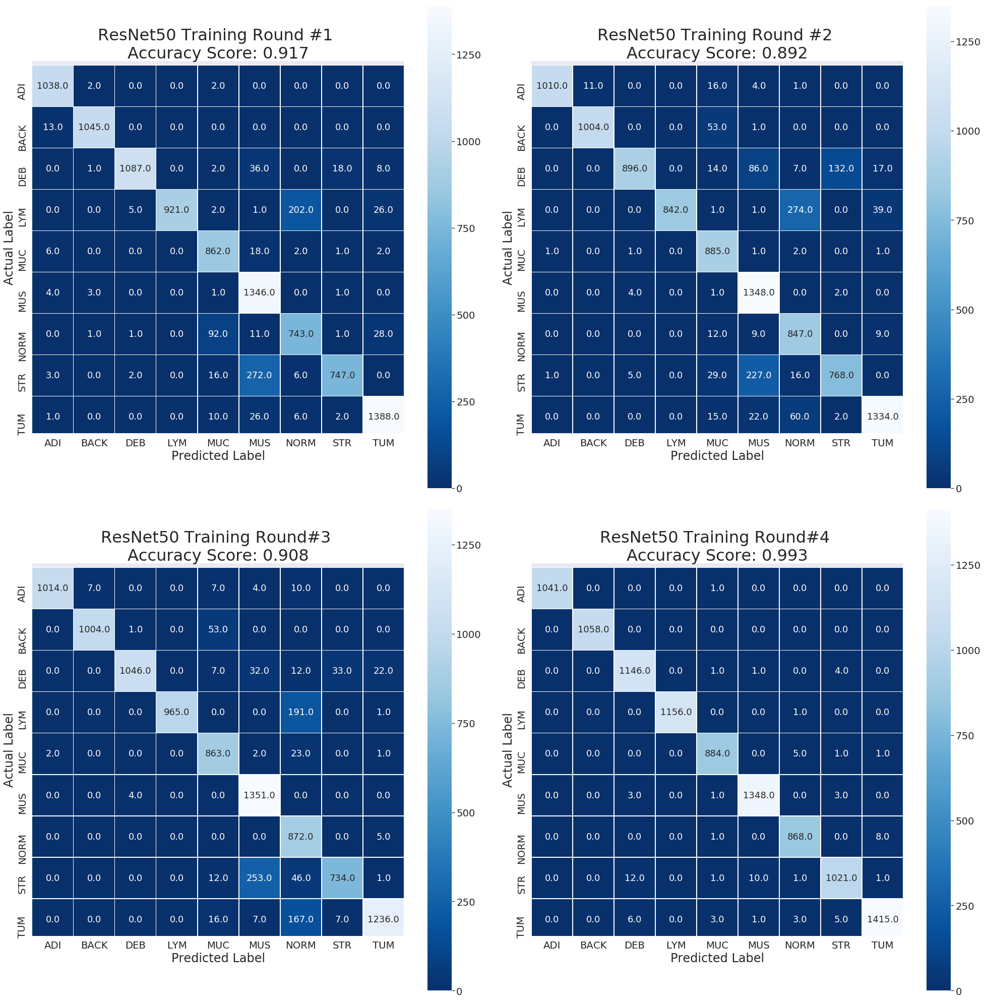

In [54]:
# Plot Confusion Matrices
sns.set(font_scale=1.8)
fig, ([ax1,ax2],[ax3,ax4]) = plt.subplots(nrows=2, ncols=2, figsize=(28,28))

#ax1
sns.heatmap(res_conf_mat_01, ax=ax1, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax1.set_ylabel("Actual Label", fontsize=24)
ax1.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="ResNet50 Training Round #1 \nAccuracy Score: {0:.3f}".format(res_test_eval_01[1])
ax1.set_title(all_sample_title, size=32)
ax1.set_ylim(len(res_conf_mat_01)-0.1, -0.1)

#ax2
sns.heatmap(res_conf_mat_02, ax=ax2, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax2.set_ylabel("Actual Label", fontsize=24)
ax2.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="ResNet50 Training Round #2 \nAccuracy Score: {0:.3f}".format(res_test_eval_02[1])
ax2.set_title(all_sample_title, size=32)
ax2.set_ylim(len(res_conf_mat_02)-0.1, -0.1)

#ax3
sns.heatmap(res_conf_mat_03, ax=ax3, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax3.set_ylabel("Actual Label", fontsize=24)
ax3.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="ResNet50 Training Round#3 \nAccuracy Score: {0:.3f}".format(res_test_eval_03[1])
ax3.set_title(all_sample_title, size=32)
ax3.set_ylim(len(res_conf_mat_03)-0.1, -0.1)

#ax4
sns.heatmap(res_conf_mat_04, ax=ax4, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 18})
ax4.set_ylabel("Actual Label", fontsize=24)
ax4.set_xlabel("Predicted Label", fontsize=24)
all_sample_title="ResNet50 Training Round#4 \nAccuracy Score: {0:.3f}".format(res_test_eval_04[1])
ax4.set_title(all_sample_title, size=32)
ax4.set_ylim(len(res_conf_mat_04)-0.1, -0.1)


plt.tight_layout()


In [89]:
# Test data
filenames = test_generator.filenames
nb_samples = len(filenames)

class_labels = test_generator.class_indices
class_names = {value:key for key,value in class_labels.items()}

labels = (ind_test_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
predictions = [labels[k] for k in res_pred_labels_04]

filenames = test_generator.filenames
results = pd.DataFrame({"Filename":filenames,
                      "Predictions":predictions})

random_files = results.sample(36)
filenames = random_files['Filename'].tolist()
predicted_labels = random_files['Predictions'].tolist()
test_file_paths = ['/floyd/home/output/test/'+ filename for filename in filenames]

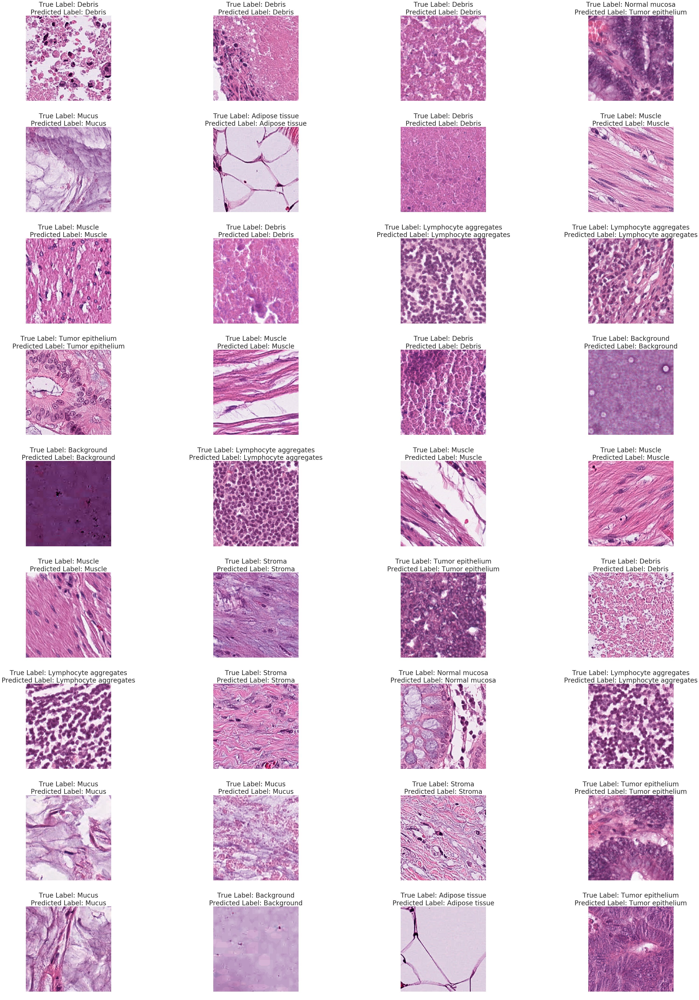

In [87]:
# Tissue types dictionary mapping class names with full names
tissue_types = {"ADI": "Adipose tissue",
               "BACK": "Background",
               "DEB": "Debris",
               "LYM": "Lymphocyte aggregates",
               "MUC": "Mucus", 
               "MUS": "Muscle",
               "NORM": "Normal mucosa", 
               "STR": "Stroma",
               "TUM": "Tumor epithelium"}

fig = plt.figure(figsize=(45,60))
fig.subplots_adjust(top=0.88)
columns = 4
rows = 9

for i in range(1, columns*rows+1):
    fig.add_subplot(rows, columns, i)
    plt.imshow(mpimg.imread(test_file_paths[i-1]))
    plt.axis('off')
    true_label = test_file_paths[i-1].split('/')[-2]
    predicted_label = predicted_labels[i-1]
    plt.title("True Label: {}\nPredicted Label: {}".format(tissue_types[true_label], tissue_types[predicted_label]), fontsize=28)
plt.tight_layout()
    
plt.show()

# Evaluating the CNN model on an independent dataset

In [55]:
# Define a path to the independent 
ind_test_dir = os.path.join(base_dir, "CRC-VAL-HE-7K")

In [56]:
# Image generator
ind_test_generator = test_datagen.flow_from_directory(ind_test_dir,
                                                      batch_size=1,
                                                      target_size=(224,224),
                                                      class_mode='categorical',
                                                      shuffle=False,
                                                      seed=42,
                                                      color_mode='rgb')
# File names and number of images
filenames = ind_test_generator.filenames
nb_samples = len(filenames)

Found 7180 images belonging to 9 classes.


## Performance of the VGG19 model on the Independent Dataset

In [57]:
vgg_val_eval_7K = model_vgg19_03.evaluate_generator(ind_test_generator)

print('Loss:      {0:.4f}'.format(vgg_val_eval_7K[0]))
print('Accuracy:  {0:.4f}'.format(vgg_val_eval_7K[1]))


# Predict Probabilities
vgg_predictions_7K = model_vgg19_03.predict_generator(ind_test_generator, steps = nb_samples, verbose=1)
# Predict Labels
vgg_pred_labels_7K = np.argmax(vgg_predictions_7K, axis=1)

# Classification Report
print('|----------------------------------------------------------|')
print('|----Independent_Data--Classification Report-(VGG19)-------|')
print('|----------------------------------------------------------|')
print(classification_report(ind_test_generator.classes, vgg_pred_labels_7K, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))
# Confusion Matrix
vgg_conf_mat_7K = pd.DataFrame(confusion_matrix(ind_test_generator.classes, vgg_pred_labels_7K), 
                               index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                               columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

Loss:      0.1906
Accuracy:  0.9390
7180/7180 [==============================] - 227s 32ms/step
|----------------------------------------------------------|
|----Independent_Data--Classification Report-(VGG19)-------|
|----------------------------------------------------------|
              precision    recall  f1-score   support

         ADI       1.00      0.96      0.98      1338
        BACK       1.00      1.00      1.00       847
         DEB       0.73      0.99      0.84       339
         LYM       0.99      0.81      0.89       634
         MUC       0.97      0.98      0.97      1035
         MUS       0.81      0.93      0.87       592
        NORM       0.92      0.95      0.94       741
         STR       0.90      0.70      0.79       421
         TUM       0.96      0.96      0.96      1233

   micro avg       0.94      0.94      0.94      7180
   macro avg       0.92      0.92      0.92      7180
weighted avg       0.94      0.94      0.94      7180



## Performance of the MobileNet model on the Independent Dataset

In [58]:
mobilenet_val_eval_7K = model_mobilenet_final.evaluate_generator(ind_test_generator)
print('Loss:      {}'.format(mobilenet_val_eval_7K[0]))
print('Accuracy:  {}'.format(mobilenet_val_eval_7K[1]))

# Predict probabilities
mobilenet_predictions_7K = model_mobilenet_03.predict_generator(ind_test_generator, steps = nb_samples, verbose=1)
# Predict labels
mobilenet_pred_labels_7K = np.argmax(mobilenet_predictions_7K, axis=1)

# Classification Report
print('----------------------------------------------------------')
print('---Independent_Data--Classification Report-(MobileNet)----')
print('----------------------------------------------------------')
print(classification_report(ind_test_generator.classes, mobilenet_pred_labels_7K, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

# Confusion Matrix
mobilenet_conf_mat_7K = pd.DataFrame(confusion_matrix(ind_test_generator.classes, mobilenet_pred_labels_7K), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

Loss:      0.399919090978719
Accuracy:  0.9153203342618385
7180/7180 [==============================] - 72s 10ms/step
----------------------------------------------------------
---Independent_Data--Classification Report-(MobileNet)----
----------------------------------------------------------
              precision    recall  f1-score   support

         ADI       0.76      0.91      0.83      1338
        BACK       1.00      0.63      0.77       847
         DEB       0.20      1.00      0.33       339
         LYM       0.96      0.64      0.77       634
         MUC       1.00      0.05      0.09      1035
         MUS       0.50      0.98      0.66       592
        NORM       0.99      0.81      0.89       741
         STR       0.15      0.29      0.19       421
         TUM       1.00      0.20      0.33      1233

   micro avg       0.57      0.57      0.57      7180
   macro avg       0.73      0.61      0.54      7180
weighted avg       0.82      0.57      0.56      7180



## Performance of the ResNet50 model on the Independent Dataset

In [61]:
# Load the saved model
model_resnet50_04.load_weights('resent50_model_04_wt.h5')

# Evaluate the model on the independent dataset
resnet50_ind_eval_7K = model_resnet50_04.evaluate_generator(ind_test_generator)
print('Loss:     {}'.format(resnet50_ind_eval_7K[0]))
print('Accuracy: {}'.format(resnet50_ind_eval_7K[1]))

# Predict probabilities
resnet50_predictions_7K = model_resnet50_04.predict_generator(ind_test_generator, steps = nb_samples, verbose=1)
# Predict labels
resnet50_pred_labels_7K = np.argmax(resnet50_predictions_7K, axis=1)


# Classification Report
print('----------------------------------------------------------')
print('---Independent_Data--Classification Report-(MobileNet)----')
print('----------------------------------------------------------')
print(classification_report(ind_test_generator.classes, resnet50_pred_labels_7K, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))

# Confusion Matrix
resent50_conf_mat_7K = pd.DataFrame(confusion_matrix(ind_test_generator.classes, resnet50_pred_labels_7K), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

Loss:     0.3393666533328235
Accuracy: 0.9279944289693594
7180/7180 [==============================] - 190s 26ms/step
----------------------------------------------------------
---Independent_Data--Classification Report-(MobileNet)----
----------------------------------------------------------
              precision    recall  f1-score   support

         ADI       0.97      0.95      0.96      1338
        BACK       0.94      1.00      0.97       847
         DEB       0.79      0.97      0.87       339
         LYM       0.98      0.98      0.98       634
         MUC       0.98      0.92      0.95      1035
         MUS       0.74      0.80      0.77       592
        NORM       0.92      0.94      0.93       741
         STR       0.93      0.63      0.75       421
         TUM       0.95      0.98      0.97      1233

   micro avg       0.93      0.93      0.93      7180
   macro avg       0.91      0.91      0.90      7180
weighted avg       0.93      0.93      0.93      7180



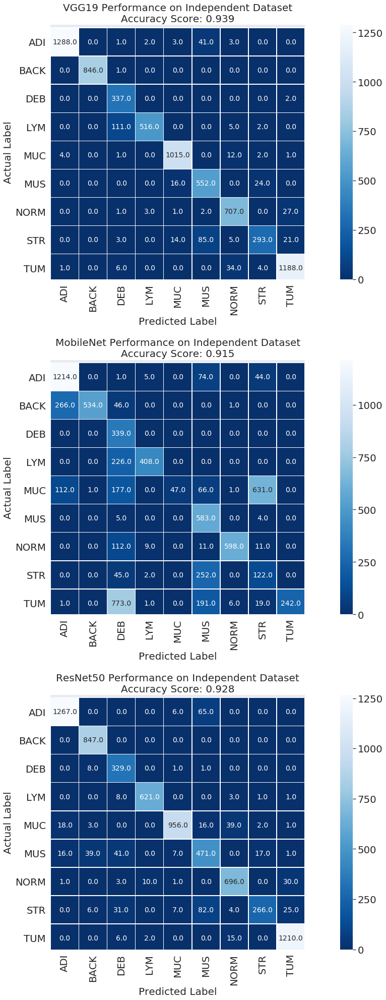

In [67]:
# Plot confusion matrices
sns.set(font_scale=1.8)
fig, ([ax1,ax2,ax3]) = plt.subplots(nrows=3, ncols=1, figsize=(20,28))

#ax1
sns.heatmap(vgg_conf_mat_7K, ax=ax1, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 14})
ax1.set_ylabel("Actual Label", fontsize=20)
ax1.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="VGG19 Performance on Independent Dataset\nAccuracy Score: {0:.3f}".format(vgg_val_eval_7K[1])
ax1.set_title(all_sample_title, size=20)
ax1.set_ylim(len(vgg_conf_mat_7K)-0.1, -0.1)

#ax2
sns.heatmap(mobilenet_conf_mat_7K, ax=ax2, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 14})
ax2.set_ylabel("Actual Label", fontsize=20)
ax2.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="MobileNet Performance on Independent Dataset\nAccuracy Score: {0:.3f}".format(mobilenet_val_eval_7K[1])
ax2.set_title(all_sample_title, size=20)
ax2.set_ylim(len(mobilenet_conf_mat_7K)-0.1, -0.1)

#ax3
sns.heatmap(resent50_conf_mat_7K, ax=ax3, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 14})
ax3.set_ylabel("Actual Label", fontsize=20)
ax3.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="ResNet50 Performance on Independent Dataset\nAccuracy Score: {0:.3f}".format(resnet50_ind_eval_7K[1])
ax3.set_title(all_sample_title, size=20)
ax3.set_ylim(len(resent50_conf_mat_7K)-0.1, -0.1)

fig.tight_layout()

## Model Stacking

In [68]:
# Load tuned VGG19 model
VGG19_model = load_model("vgg19_model_finetuned.h5")

# Load tuned ResNet50 model
ResNet50_model = load_model("resent50_model_04_wt.h5")

# Load tuned MobileNet model
base_model_mobilenet_03 = MobileNet(input_shape=(224, 224, 3),
                                    include_top = False)
x = base_model_mobilenet_03.output
flat = GlobalAveragePooling2D()(x)
hidden_1 = Dense(1024, activation='relu')(flat)
drop_1 = Dropout(0.2)(hidden_1)
hidden_2 = Dense(512, activation='relu')(drop_1)
drop_2 = Dropout(0.3)(hidden_2)
output = Dense(9, activation= 'softmax')(drop_2)
model_mobilenet_03= Model(base_model_mobilenet_03.inputs, output)
model_mobilenet_03.compile(loss="categorical_crossentropy", optimizer=Adam(lr=0.0001), metrics=["accuracy"])
model_mobilenet_03.load_weights("mobilenet_model_final_wt.h5")

In [69]:
# get prediction probablilities from all three models
vgg_predictions_7K = VGG19_model.predict_generator(ind_test_generator,steps = nb_samples,verbose=1)
resnet_predictions_7K = ResNet50_model.predict_generator(ind_test_generator,steps = nb_samples,verbose=1)
mobilenet_predictions_7K = model_mobilenet_03.predict_generator(ind_test_generator,steps = nb_samples,verbose=1)

7180/7180 [==============================] - 78s 11ms/step


In [70]:
# Average prediction of all three models
combined_prediction = np.mean([vgg_predictions_7K, resnet_predictions_7K, mobilenet_predictions_7K], axis=0)
combined_prediction_labels = np.argmax(combined_prediction, axis=1)

In [74]:
# Classification Report
print('----------------------------------------------------------')
print('-Independent_Data--Classification Report-(Combined Model)-')
print('----------------------------------------------------------')
print(classification_report(ind_test_generator.classes, combined_prediction_labels, 
                            target_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']))


----------------------------------------------------------
-Independent_Data--Classification Report-(Combined Model)-
----------------------------------------------------------
              precision    recall  f1-score   support

         ADI       1.00      0.97      0.98      1338
        BACK       1.00      1.00      1.00       847
         DEB       0.73      1.00      0.84       339
         LYM       0.99      0.85      0.92       634
         MUC       0.98      0.99      0.99      1035
         MUS       0.81      0.97      0.88       592
        NORM       0.98      0.96      0.97       741
         STR       0.99      0.66      0.79       421
         TUM       0.96      0.98      0.97      1233

   micro avg       0.95      0.95      0.95      7180
   macro avg       0.94      0.93      0.93      7180
weighted avg       0.96      0.95      0.95      7180



(8.9, -0.1)

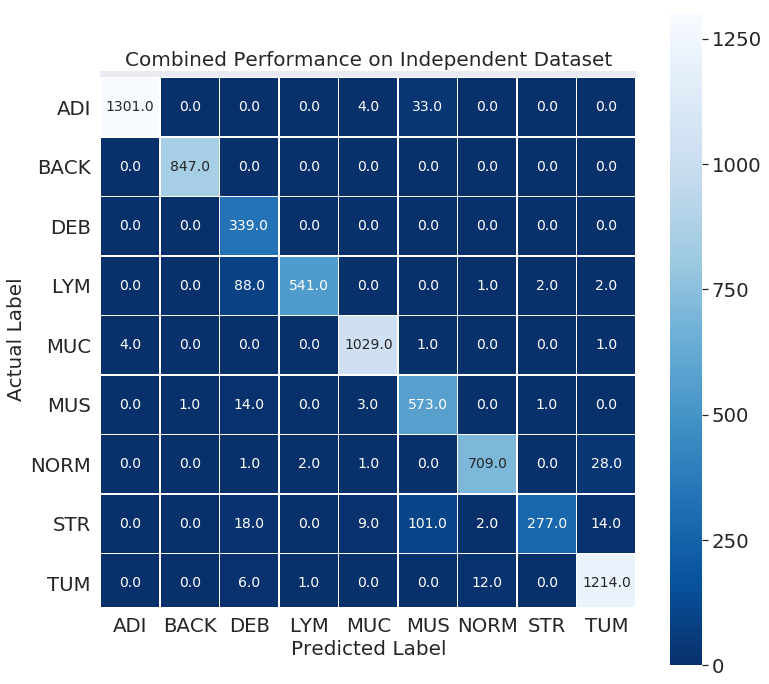

In [73]:
# Confusion Matrix
combined_conf_mat_7K = pd.DataFrame(confusion_matrix(ind_test_generator.classes, combined_prediction_labels), 
                        index=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'], 
                        columns=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'])

# Plot confusion matrices
sns.set(font_scale=1.8)
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12,12))

#ax1
sns.heatmap(combined_conf_mat_7K, ax=ax, annot=True, fmt=".1f", linewidths=0.5, square=True, cmap='Blues_r', annot_kws={"size": 14})
ax.set_ylabel("Actual Label", fontsize=20)
ax.set_xlabel("Predicted Label", fontsize=20)
all_sample_title="Combined Performance on Independent Dataset"
ax.set_title(all_sample_title, size=20)
ax.set_ylim(len(vgg_conf_mat_7K)-0.1, -0.1)